In [1]:
import os
# import rasterio
import argparse
import subprocess
# import rioxarray
import numpy as np 
import xarray as xr 
import pandas as pd
from glob import glob
from tqdm import tqdm
import geopandas as gpd
import matplotlib as mpl
import cartopy.crs as ccrs
from rasterio.mask import mask
import matplotlib.pyplot as plt 
from cartopy import feature as cfeature
from netCDF4 import Dataset
os.chdir("/mnt/beegfs/lcesarini")

path_milan="/home/mathew.milan/SPHERA/pr_nc/"

In [2]:
ds_mil=xr.open_mfdataset(glob(f"{path_milan}/*2005*")[0])
ds_mil

<xarray.Dataset>
Dimensions:    (latitude: 500, longitude: 520, time: 8759)
Coordinates:
    surface    float64 ...
  * latitude   (latitude) float64 35.0 35.03 35.06 35.08 ... 48.67 48.69 48.72
  * longitude  (longitude) float64 5.483 5.51 5.538 5.565 ... 19.7 19.73 19.75
  * time       (time) datetime64[ns] 2005-01-01T01:00:00 ... 2005-12-31T23:00:00
Data variables:
    tp         (time, latitude, longitude) float64 dask.array<chunksize=(8759, 500, 520), meta=np.ndarray>

In [3]:
ds_lui=xr.open_mfdataset("/mnt/beegfs/lcesarini/SPHERA/decumulated/SPHERA_2005*.nc")
ds_lui

<xarray.Dataset>
Dimensions:    (latitude: 158, longitude: 272, time: 8760)
Coordinates:
  * latitude   (latitude) float64 43.25 43.28 43.3 43.33 ... 47.51 47.54 47.57
  * longitude  (longitude) float64 6.5 6.527 6.555 6.582 ... 13.9 13.92 13.95
  * time       (time) datetime64[ns] 2005-01-01T01:00:00 ... 2006-01-01
Data variables:
    pr         (time, latitude, longitude) float32 dask.array<chunksize=(744, 158, 272), meta=np.ndarray>
Attributes: (12/36)
    GRIB_paramId:                             228228
    GRIB_dataType:                            an
    GRIB_numberOfPoints:                      42976
    GRIB_typeOfLevel:                         surface
    GRIB_stepUnits:                           1
    GRIB_stepType:                            accum
    ...                                       ...
    GRIB_centre:                              edzw
    GRIB_centreDescription:                   Offenbach
    GRIB_subCentre:                           255
    Conventions:                              CF-1.7
    institution:                              Offenbach
    history:                                  2024-03-28T17:36 GRIB to CDM+CF...

In [4]:
def crop_to_extent(xr,xmin=10.38,xmax=13.1,ymin=44.7,ymax=47.1):
    """
    Functions that select inside a given extent

    Parameters
    ----------
    xr : xarrayDataset, 
        xarray dataset to crop
    
    xmin,xmax,ymin,ymax: coordinates of the extent desired.    
    
    Returns
    -------
    
    cropped_ds: xarray dataset croppped

    Examples
    --------
    """
    if 'lat' in list(xr.coords):
        xr_crop=xr.where((xr.lon > xmin) & (xr.lon < xmax) &\
                        (xr.lat > ymin) & (xr.lat < ymax), 
                        drop=True)
    elif 'latitude' in list(xr.coords):
        xr_crop=xr.where((xr.longitude >= xmin) & (xr.longitude <= xmax) &\
                        (xr.latitude >= ymin) & (xr.latitude <= ymax), 
                        drop=True)

    return xr_crop

In [5]:
ds_milan_cropped=crop_to_extent(ds_mil,xmin=6.5,xmax=13.95,ymin=43.25,ymax=47.57)

/home/luigi.cesarini/.conda/envs/my_xclim_env/lib/python3.11/site-packages/xarray/core/indexing.py:1449: PerformanceWarning: Slicing is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array[indexer]

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array[indexer]
  value = value[(slice(None),) * axis + (subkey,)]


In [6]:
ds_milan_cropped=ds_milan_cropped.load()
ds_lui=ds_lui.load()

/home/luigi.cesarini/.conda/envs/my_xclim_env/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1577: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


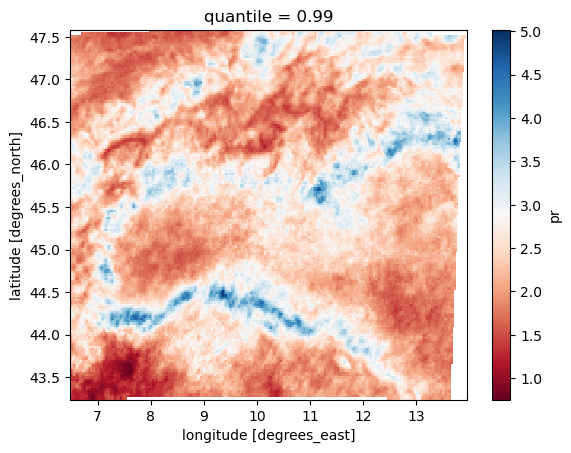

In [7]:
ds_lui.pr.quantile(dim='time',q=0.99).plot(cmap='RdBu')

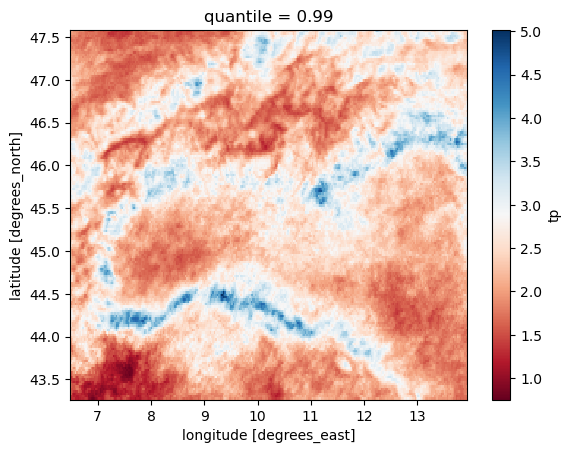

In [8]:
ds_milan_cropped.tp.quantile(dim='time',q=0.99).plot(cmap='RdBu')

In [9]:
q_mil=ds_milan_cropped.tp.quantile(dim='time',q=0.99)
q_lui=ds_lui.pr.quantile(dim='time',q=0.99)

In [10]:
LON,LAT=q_lui.longitude.values,q_lui.latitude.values

In [11]:
def create_list_coords(ls_lon,ls_lat):
    """
    Create an array of ALL the combinations from two lists of points
    """
    xx,yy=np.meshgrid(ls_lon,ls_lat)
    list_xy=np.concatenate([xx.reshape(-1,1),yy.reshape(-1,1)],axis=1)
    return list_xy

list_coords=create_list_coords(LON,LAT)

In [51]:
bias=[]
for coords in list_coords:
    if ~np.isnan(q_lui.sel(longitude=coords[0],latitude=coords[1]).values):
        bias.append(np.array((q_lui.sel(longitude=coords[0],latitude=coords[1]) - q_mil.sel(longitude=coords[0],latitude=coords[1],method='nearest')) / q_mil.sel(longitude=coords[0],latitude=coords[1],method='nearest')).item() * 100)
    else:
        bias.append(np.nan)

In [57]:
id_max=np.nanargmax(bias)
bias[id_max]

13.121741117489288

In [58]:
(q_lui.sel(longitude=list_coords[id_max][0],latitude=list_coords[id_max][1]) - q_mil.sel(longitude=list_coords[id_max][0],latitude=list_coords[id_max][1],method='nearest')) / q_mil.sel(longitude=list_coords[id_max][0],latitude=list_coords[id_max][1],method='nearest').values.item() * 100

<xarray.DataArray ()>
array(13.12174112)
Coordinates:
    quantile  float64 0.99

In [59]:
q_lui.sel(longitude=list_coords[id_max][0],latitude=list_coords[id_max][1]), q_mil.sel(longitude=list_coords[id_max][0],latitude=list_coords[id_max][1],method='nearest')

(<xarray.DataArray 'pr' ()>
 array(3.19067383)
 Coordinates:
     latitude   float64 47.54
     longitude  float64 13.29
     quantile   float64 0.99,
 <xarray.DataArray 'tp' ()>
 array(2.82056641)
 Coordinates:
     latitude   float64 47.54
     longitude  float64 13.29
     quantile   float64 0.99)

In [61]:
(3.19 - 2.82) / 2.82

0.1312056737588653

<Axes: >

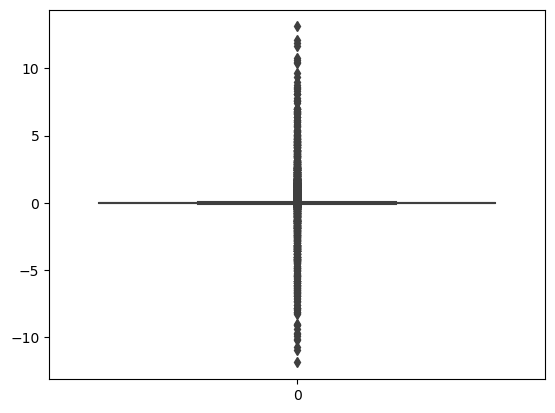

In [21]:
import seaborn as sns

sns.boxplot(bias)

In [24]:
bias[np.argmax(bias)]

13.121741117489288

In [63]:
(3.47155273-3.47162109)/3.47162109*100

-0.0019691089041117557

In [61]:
q_lui.sel(longitude=list_coords[41479][0],latitude=list_coords[41479][1]), q_mil.sel(longitude=list_coords[41479][0],latitude=list_coords[41479][1],method='nearest')

(<xarray.DataArray 'pr' ()>
 array(3.47155273)
 Coordinates:
     latitude   float64 47.43
     longitude  float64 10.21
     quantile   float64 0.99,
 <xarray.DataArray 'tp' ()>
 array(3.47162109)
 Coordinates:
     latitude   float64 47.43
     longitude  float64 10.21
     quantile   float64 0.99)

In [1]:
import xarray as xr
from glob import glob
ll_files=glob("/mnt/beegfs/lcesarini/2024_hail/out/hail_90m/*10_5_43_3*")
ds=[xr.open_mfdataset(f).load() for f in ll_files]

In [2]:
#Comine list of xarray
ds=xr.concat(ds,dim='time')

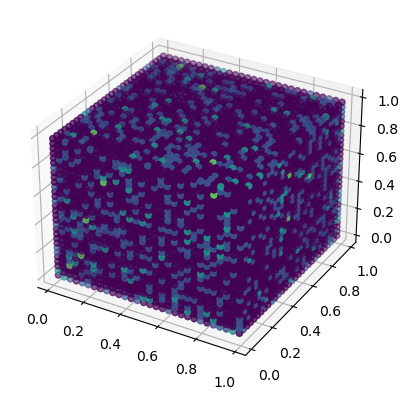

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Define your three arrays
array1 = np.random.rand(8760, 1)
array2 = np.random.rand(8760, 1)
array3 = np.random.rand(8760, 1)

# Stack arrays in sequence horizontally (column wise)
data = np.column_stack((array1, array2, array3))

# Create a histogramdd
hist, edges = np.histogramdd(data, bins=(30, 30, 30))

# Normalize to get the relative frequencies
hist /= hist.sum()

# Create a 3D plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Get the coordinates of the edges of the bins
x_edges, y_edges, z_edges = edges

# Get the coordinates of the centers of the bins
x_centers = x_edges[:-1] + np.diff(x_edges) / 2
y_centers = y_edges[:-1] + np.diff(y_edges) / 2
z_centers = z_edges[:-1] + np.diff(z_edges) / 2

# Create a meshgrid for the centers
x_centers, y_centers, z_centers = np.meshgrid(x_centers, y_centers, z_centers)

# Plot the histogram
ax.scatter3D(x_centers, y_centers, z_centers, c=hist.flatten(), cmap='viridis')

plt.show()


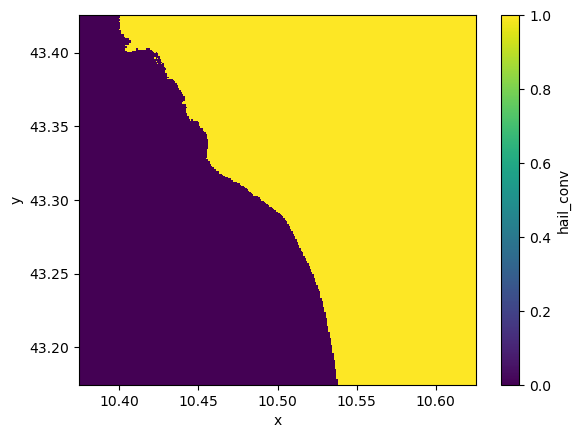

In [6]:
import numpy as np
ds.max(dim='time').hail_conv.plot()

In [1]:
import os
# import rasterio
import argparse
import subprocess
# import rioxarray
import numpy as np 
import xarray as xr 
import pandas as pd
from glob import glob
from tqdm import tqdm
import geopandas as gpd
import matplotlib as mpl
import cartopy.crs as ccrs
from rasterio.mask import mask
import matplotlib.pyplot as plt 
from cartopy import feature as cfeature
from netCDF4 import Dataset
os.chdir("/mnt/beegfs/lcesarini/")

In [2]:
PATH_COMMON_DATA="/mnt/beegfs/lcesarini/DATA_FPS"
list_ref_train=[glob(f"{PATH_COMMON_DATA}/reanalysis/SPHERA/pr/*{year}*") for year in np.arange(2000,2010)]

In [3]:
def get_unlist(ll:list) -> list:
    ul=[]
    for sublist in ll:
        for file in sublist:
            ul.append(file)
    return ul

In [4]:
import warnings

MODELS=["CNRM","KNMI","ICTP","HCLIMcom","MOHC","CMCC","KIT","ETH"]

for mdl in MODELS:
    list_mod_adjust=[glob(f"{PATH_COMMON_DATA}/Rcp85/{mdl}/CPM/pr/*{year}*") for year in np.arange(2041,2051)]
    for path in get_unlist(list_mod_adjust):
        
        try:
            # Assuming `xr_data` is the xarray you're trying to read
            # Replace this with your actual code to read the xarray
            xr_data = xr.open_dataset(path)
        except Exception as e:
            # If reading fails, raise a warning without breaking the program
            # warnings.warn("Failed to read xarray: {}".format(str(e)))
            warnings.warn(f"{e}")
            # Set xr_data to None or any default value to handle the failure gracefully
            xr_data = None


/tmp/ipykernel_1433406/2479720178.py:16: UserWarning: [Errno -101] NetCDF: HDF error: '/mnt/beegfs/lcesarini/DATA_FPS/Rcp85/ICTP/CPM/pr/ICTP_Rcp85_204301010030-204312302330.nc'
  warnings.warn(f"{e}")
/tmp/ipykernel_1433406/2479720178.py:16: UserWarning: [Errno -101] NetCDF: HDF error: '/mnt/beegfs/lcesarini/DATA_FPS/Rcp85/KIT/CPM/pr/KIT_Rcp85_204901010030-204912312330.nc'
  warnings.warn(f"{e}")


In [ ]:
#read an xarray

In [16]:
import warnings

MODELS=["CNRM","KNMI","ICTP","HCLIMcom","MOHC","CMCC","KIT","ETH"]

for mdl in MODELS:
    list_mod_adjust=[glob(f"{PATH_COMMON_DATA}/Rcp85/{mdl}/CPM/pr/*{year}*") for year in np.arange(2090,2100)]
    for path in get_unlist(list_mod_adjust):
        
        try:
            # Assuming `xr_data` is the xarray you're trying to read
            # Replace this with your actual code to read the xarray
            xr_data = xr.open_dataset(path)
            if not (xr_data.time[-1].values > xr_data.time[0].values): 
                print(f"qui gatta ci cova: {mdl} _ {pd.to_datetime(xr_data.time[0].values).year}")
        except Exception as e:
            # If reading fails, raise a warning without breaking the program
            warnings.warn("Failed to read xarray: {}".format(str(e)))
            # Set xr_data to None or any default value to handle the failure gracefully
            xr_data = None


qui gatta ci cova: CNRM _ 2095


/tmp/ipykernel_1163681/4047695049.py:17: UserWarning: Failed to read xarray: [Errno -101] NetCDF: HDF error: '/mnt/beegfs/lcesarini/DATA_FPS/Rcp85/KNMI/CPM/pr/KNMI_Rcp85_209101010030-209112312330.nc'
  warnings.warn("Failed to read xarray: {}".format(str(e)))


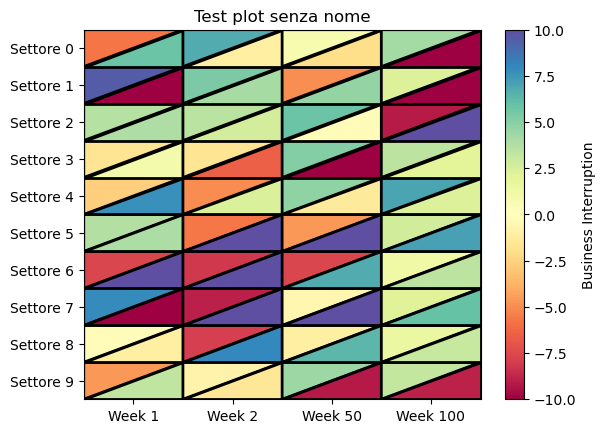

In [29]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Example data generation
data = np.random.rand(10, 4) * 20 - 10       # Replace with actual data
half_data = np.random.rand(10, 4) * 20 - 10  # Replace with actual data#data / 2  # This is for demonstration, you might want to split differently

# Create the plot
fig, ax = plt.subplots()

# Set the limits of the plot
ax.set_xlim(0, data.shape[1])
ax.set_ylim(0, data.shape[0])

# Plot each square split into two triangles
for i in range(data.shape[0]):
    for j in range(data.shape[1]):
        # Coordinates of the corners of the square
        x, y = j, data.shape[0] - i - 1
        
        # Value for the upper triangle
        val1 = half_data[i, j]
        color1 = plt.cm.Spectral((val1 + 10) / 20)  # Normalize and map to color

        # Value for the lower triangle
        val2 = data[i, j] - half_data[i, j]
        color2 = plt.cm.Spectral((val2 + 10) / 20)  # Normalize and map to color

        # Create and add the upper triangle
        upper_triangle = patches.Polygon([(x, y), (x+1, y), (x, y+1)], closed=True, color=color1,ec='black',linewidth=2)
        ax.add_patch(upper_triangle)

        # Create and add the lower triangle
        lower_triangle = patches.Polygon([(x+1, y), (x+1, y+1), (x, y+1)], closed=True, color=color2,ec='black',linewidth=2)
        ax.add_patch(lower_triangle)

# Set the x-ticks and y-ticks
ax.set_xticks(np.arange(data.shape[1]) + 0.5)
ax.set_xticklabels(['Week 1', 'Week 2', 'Week 50', 'Week 100'])
ax.set_yticks(np.arange(data.shape[0]) + 0.5)
ax.set_yticklabels([f'Settore {i}' for i in range(data.shape[0])])

# Add a color bar
sm = plt.cm.ScalarMappable(cmap='Spectral', norm=plt.Normalize(vmin=-10, vmax=10))
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Business Interruption')

# Add labels and title
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_title('Test plot senza nome')

plt.gca().invert_yaxis()  # Invert y-axis to match the data orientation
plt.show()


In [9]:
val1,val2

(-0.7172436055324543, -4.1923470620551635)

In [21]:
xr.open_dataset('/mnt/beegfs/lcesarini/DATA_FPS/Rcp85/HCLIMcom/CPM/pr/HCLIMcom_Rcp85_204101010030-204112312330.nc')


OSError: [Errno -101] NetCDF: HDF error: '/mnt/beegfs/lcesarini/DATA_FPS/Rcp85/HCLIMcom/CPM/pr/HCLIMcom_Rcp85_204101010030-204112312330.nc'

In [20]:
xr.open_dataset('/home/luigi.cesarini/pr_ALP-3_ICHEC-EC-EARTH_rcp85_r12i1p1_HCLIMcom-HCLIM38-AROME_fpsconv-x2yn2-v1_1hr_204101010030-204112312330.nc')


<xarray.Dataset>
Dimensions:    (time: 8760, bnds: 2, lon: 272, lat: 158)
Coordinates:
  * time       (time) datetime64[ns] 2041-01-01T00:30:00 ... 2041-12-31T23:30:00
  * lon        (lon) float64 6.5 6.527 6.555 6.582 ... 13.87 13.9 13.92 13.95
  * lat        (lat) float64 43.25 43.28 43.3 43.33 ... 47.48 47.51 47.54 47.57
Dimensions without coordinates: bnds
Data variables:
    time_bnds  (time, bnds) datetime64[ns] ...
    pr         (time, lat, lon) float32 ...
Attributes: (12/28)
    CDI:                            Climate Data Interface version 2.1.1 (htt...
    Conventions:                    CF-1.4
    source:                         HARMONIE Climate Modelling Community (HCL...
    institution:                    The HARMONIE Climate Modelling Community ...
    conventionsURL:                 http://www.cfconventions.org
    title:                          HCLIMcom-HCLIM38-AROME model output prepa...
    ...                             ...
    product:                        output
    frequency:                      1hr
    tracking_id:                    2bd78862-7adc-11eb-9fb4-05bb61138c7d
    creation_date:                  2021-03-01 23:19:21
    history:                        Mon May 13 15:01:38 2024: cdo remapycon,/...
    CDO:                            Climate Data Operators version 2.1.1 (htt...

In [7]:
nc=Dataset(f'{PATH_COMMON_DATA}/reanalysis/SPHERA/pr/200003_ten1_Tdeep_tpH_zoom.nc', mode='r')
dataset = xr.open_dataset(xr.backends.NetCDF4DataStore(nc))
dataset

<xarray.Dataset>
Dimensions:    (time: 240, latitude: 158, longitude: 272)
Coordinates:
  * time       (time) datetime64[ns] 2000-03-01T01:00:00 ... 2000-03-11
    surface    float64 ...
  * latitude   (latitude) float64 43.25 43.28 43.3 43.33 ... 47.51 47.54 47.57
  * longitude  (longitude) float64 6.5 6.527 6.555 6.582 ... 13.9 13.92 13.95
Data variables:
    pr         (time, latitude, longitude) float64 ...
Attributes:
    GRIB_edition:            2
    GRIB_centre:             edzw
    GRIB_centreDescription:  Offenbach 
    GRIB_subCentre:          255
    Conventions:             CF-1.7
    institution:             Offenbach 
    history:                 2023-03-08T12:57 GRIB to CDM+CF via cfgrib-0.9.1...

In [11]:
list_xr=[xr.open_dataset(xr.backends.NetCDF4DataStore(Dataset(path, mode='r'))) for path in get_unlist(list_ref_train)]

In [13]:
SPH=xr.concat(list_xr,dim='time')

In [14]:
SPH

<xarray.Dataset>
Dimensions:    (time: 87543, latitude: 158, longitude: 272)
Coordinates:
  * time       (time) datetime64[ns] 2000-11-01T01:00:00 ... 2009-05-21
    surface    float64 0.0
  * latitude   (latitude) float64 43.25 43.28 43.3 43.33 ... 47.51 47.54 47.57
  * longitude  (longitude) float64 6.5 6.527 6.555 6.582 ... 13.9 13.92 13.95
Data variables:
    pr         (time, latitude, longitude) float64 0.0 0.0 0.0 ... nan nan nan
Attributes:
    GRIB_edition:            2
    GRIB_centre:             edzw
    GRIB_centreDescription:  Offenbach 
    GRIB_subCentre:          255
    Conventions:             CF-1.7
    institution:             Offenbach 
    history:                 2023-03-08T13:00 GRIB to CDM+CF via cfgrib-0.9.1...

In [5]:
xr.open_dataset("./DATA_FPS/Rcp85/ETH/CPM/pr/ETH_Rcp85_204201010030_204212312330.nc")

<xarray.Dataset>
Dimensions:    (time: 8760, bnds: 2, lon: 272, lat: 158)
Coordinates:
  * time       (time) datetime64[ns] 2042-01-01T00:33:00 ... 2042-12-31T23:33:00
  * lon        (lon) float64 6.5 6.527 6.555 6.582 ... 13.87 13.9 13.92 13.95
  * lat        (lat) float64 43.25 43.28 43.3 43.33 ... 47.48 47.51 47.54 47.57
Dimensions without coordinates: bnds
Data variables:
    time_bnds  (time, bnds) datetime64[ns] ...
    pr         (time, lat, lon) float32 ...
Attributes:
    CDI:             Climate Data Interface version 1.9.8 (https://mpimet.mpg...
    Conventions:     CF-1.4
    history:         Tue May 23 13:47:47 2023: cdo remapycon,newcommongrid.tx...
    conventionsURL:  http://www.cfconventions.org/
    creation_date:   2019-04-12 08:14:22
    NCO:             netCDF Operators version 4.8.1 (Homepage = http://nco.sf...
    CDO:             Climate Data Operators version 1.9.8 (https://mpimet.mpg...

In [7]:
xr.open_dataset("./DATA_FPS/Rcp85/ICTP/CPM/pr/ICTP_Rcp85_204601010030-204612302330.nc")

<xarray.Dataset>
Dimensions:    (time: 8640, bnds: 2, lon: 272, lat: 158)
Coordinates:
  * time       (time) object 2046-01-01 00:30:00 ... 2046-12-30 23:30:00
  * lon        (lon) float64 6.5 6.527 6.555 6.582 ... 13.87 13.9 13.92 13.95
  * lat        (lat) float64 43.25 43.28 43.3 43.33 ... 47.48 47.51 47.54 47.57
Dimensions without coordinates: bnds
Data variables:
    time_bnds  (time, bnds) object ...
    pr         (time, lat, lon) float32 ...
Attributes: (12/152)
    CDI:                                       Climate Data Interface version...
    history:                                   Mon Jun 12 15:03:57 2023: cdo ...
    source:                                    RegCM Model output file
    institution:                               International Centre for Theor...
    Conventions:                               CF-1.7
    ipcc_scenario_code:                        RCP85
    ...                                        ...
    frequency:                                 1hr
    driving_experiment:                        MOHC-HadGEM2-ES, rcp85, r1i1p1
    driving_model_id:                          MOHC-HadGEM2-ES
    rcm_version_id:                            fpsconv-x2yn2-v1
    project_id:                                CORDEX-FPSCONV
    CDO:                                       Climate Data Operators version...

In [ ]:
"lcesarini/BIAS_CORRECTED/EQM/CNRM/pr/CNRM_CORR_SPHERA_DJF_Q900_SEQUENTIAL_VALIDATION_northern_italy.nc"


In [2]:
from resilience.utils import *

cmap_f,cmap_i,cmap_q=get_palettes()
lvl_f,lvl_i,lvl_q=get_levels()

In [11]:
list_mdl=["CNRM","KNMI","ICTP","HCLIMcom","KIT","CMCC","ETH"]


In [110]:
PATH_OUTPUT="/home/lcesarini/2022_resilience/output/mw/JJA/"

In [48]:
sea_mask=xr.open_dataset("/mnt/data/RESTRICTED/CARIPARO/DATA_FPS/ECMWF-ERAINT/CNRM/sftlf_ALP-3_CNRM-CERFACS-CNRM-CM5_historical_r1i1p1_CNRM-AROME41t1_fx_remap.nc")

x=xr.open_mfdataset("/mnt/data/RESTRICTED/CARIPARO/DATA_FPS/reanalysis/SPHERA/mw/*").load()
x=x*xr.where(sea_mask.sftlf<0.25, np.nan,sea_mask.sftlf).values

In [28]:
from scipy.stats import percentileofscore
y2=[]
for i in range(158):
    for j in range(272):
        y2.append(percentileofscore(x.mw.values[:,i,j],6,nan_policy='omit'))

<AxesSubplot: >

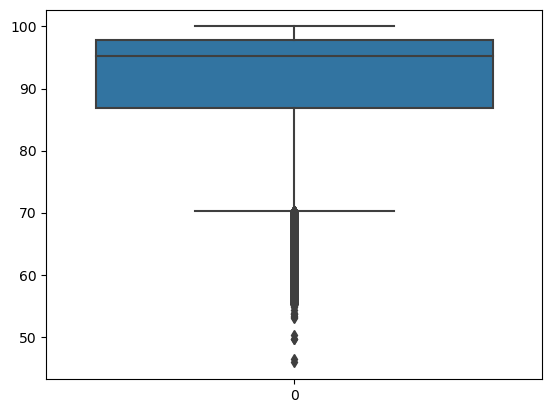

In [21]:
sns.boxplot(y)

In [23]:
PATH_COMMON_DATA="/mnt/data/RESTRICTED/CARIPARO/DATA_FPS"
list_ref_adjust=[glob(f"{PATH_COMMON_DATA}/reanalysis/SPHERA/pr/*{year}*") for year in np.arange(2000,2010)]
ref_adjust=xr.open_mfdataset([item for list in list_ref_adjust for item in list]).load()


In [26]:
from scipy.stats import percentileofscore
y=[]
for i in range(158):
    for j in range(272):
        y.append(percentileofscore(ref_adjust.pr.values[:,i,j],0.1,nan_policy='omit'))

In [46]:
ref_adjust=ref_adjust*xr.where(sea_mask.sftlf<0.25, np.nan,sea_mask.sftlf).values
AMS_pr=ref_adjust.resample(time='1Y').max()

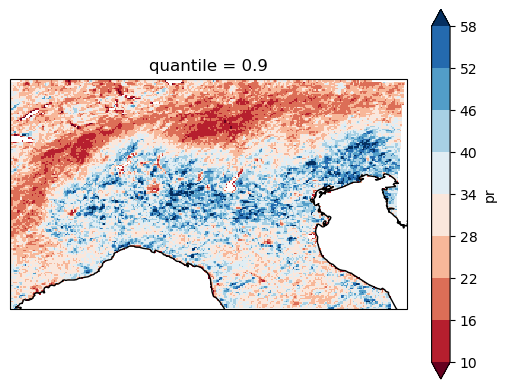

In [51]:
ax=plt.axes(projection=ccrs.PlateCarree())
AMS_pr.quantile(dim='time',q=0.9).pr.plot.pcolormesh(levels=np.arange(10,60,6),cmap="RdBu")
ax.coastlines()

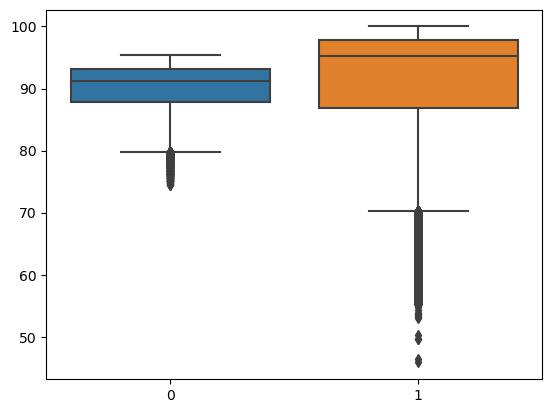

In [34]:

sns.boxplot([y,y2]);

Text(0.5, 1.0, 'Definition of event')

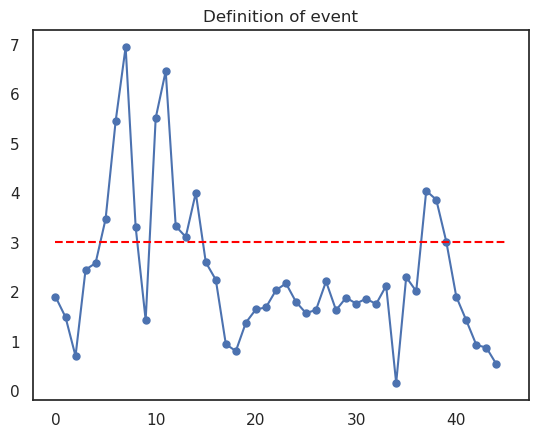

In [136]:
plt.plot(x.isel(lat=25,lon=25).mw.values[9635:9680],'bo-',markersize=5)
plt.hlines(y=3,linestyles='dashed',color='red',xmin=0,xmax=45)

plt.title("Definition of event")

In [112]:
mdl='CNRM'
ori=[xr.open_dataset(f"{PATH_OUTPUT}{mdl}_q_biased_SPHERA_1000_SEQUENTIAL_VALIDATION_northern_italy.nc") for mdl in list_mdl]
eqm=[xr.open_dataset(f"{PATH_OUTPUT}{mdl}_q_QDM_SPHERA_1000_SEQUENTIAL_VALIDATION_northern_italy.nc") for mdl in list_mdl]
qdm=[xr.open_dataset(f"{PATH_OUTPUT}{mdl}_q_EQM_SPHERA_1000_SEQUENTIAL_VALIDATION_northern_italy.nc") for mdl in list_mdl]
sph=xr.open_dataset("/home/lcesarini/2022_resilience/output/mw/JJA/SPHERA_q_1000_SEQUENTIAL_VALIDATION_northern_italy.nc")
eqm

FileNotFoundError: [Errno 2] No such file or directory: b'/home/lcesarini/2022_resilience/output/mw/JJA/SPHERA_q_biased_SPHERA_1000_SEQUENTIAL_VALIDATION_northern_italy.nc'

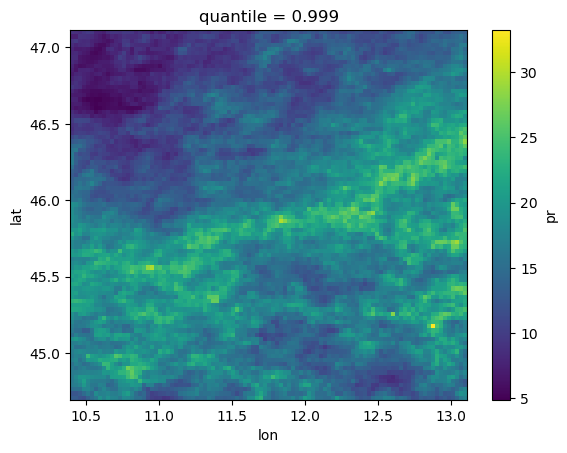

In [8]:
ori=xr.open_dataset("/home/lcesarini/2022_resilience/output/JJA/ENSEMBLE_q_biased_SPHERA_1000_SEQUENTIAL_VALIDATION.nc")
eqm=xr.open_dataset("/home/lcesarini/2022_resilience/output/JJA/ENSEMBLE_q_EQM_SPHERA_1000_SEQUENTIAL_VALIDATION.nc")
qdm=xr.open_dataset("/home/lcesarini/2022_resilience/output/JJA/ENSEMBLE_q_QDM_SPHERA_1000_SEQUENTIAL_VALIDATION.nc")
sph=xr.open_dataset("/home/lcesarini/2022_resilience/output/JJA/SPHERA_q_1000_SEQUENTIAL_VALIDATION.nc")
eqm.pr.plot()

In [2]:
import os
os.environ['USE_PYGEOS'] = '0'
import sys
sys.path.append("/home/lcesarini/2022_resilience/")
import argparse
import rioxarray
import numpy as np 
import xarray as xr 
import pandas as pd
from glob import glob
from tqdm import tqdm
import geopandas as gpd
import matplotlib as mpl
from random import sample
# import xarray.ufuncs as xu                            
import cartopy.crs as ccrs
import matplotlib.pyplot as plt 
from shapely.geometry import mapping
from cartopy import feature as cfeature
from math import pi,sin,cos, asin, atan2
from sklearn.metrics import (mean_absolute_error,mean_squared_error,
                             r2_score,mean_absolute_percentage_error)

import warnings
warnings.filterwarnings('ignore')

os.chdir("/home/lcesarini/2022_resilience/")

PATH_COMMON_DATA="/mnt/data/RESTRICTED/CARIPARO/DATA_FPS"
PATH_BIAS_CORRECTED = f"/mnt/data/lcesarini/BIAS_CORRECTED/" 

from resilience.utils import *


In [6]:
lvl_f,lvl_i,lvl_q=get_levels()
cmap_f,cmap_i,cmap_q=get_palettes()

REF="SPHERA"
DEBUG=True
metrics = ['mean', 'q', 'thr']
if DEBUG:
    ADJUST = 'VALIDATION'
    NQUANT=1000
    BOXPLOTS=True
    MAPS=True
    metrics='q'

mask=xr.open_dataset("data/mask_stations_nan_common.nc")
sea_mask=xr.open_dataset("/mnt/data/RESTRICTED/CARIPARO/DATA_FPS/ECMWF-ERAINT/CNRM/sftlf_ALP-3_CNRM-CERFACS-CNRM-CM5_historical_r1i1p1_CNRM-AROME41t1_fx_remap.nc")


In [22]:
f"/home/lcesarini/2022_resilience/output/mw/{seas}/*{metrics}_**{REF}**{NQUANT}**{ADJUST}.*"

'/home/lcesarini/2022_resilience/output/mw/JJA/*q_**SPHERA**1000**VALIDATION*'

In [179]:
seas='JJA'

list_output_mdl=glob(f"/home/lcesarini/2022_resilience/output/{seas}/*{metrics}_**{REF}**{NQUANT}**{ADJUST}.*")
list_output_mdl=list_output_mdl+glob(f"/home/lcesarini/2022_resilience/output/{seas}/*{REF}**{metrics}_**{NQUANT}**{ADJUST}.*")
list_mdl=[os.path.basename(file).split("_")[0] for file in list_output_mdl]
list_output_mdl

['/home/lcesarini/2022_resilience/output/JJA/MOHC_q_biased_SPHERA_1000_SEQUENTIAL_VALIDATION.nc',
 '/home/lcesarini/2022_resilience/output/JJA/MOHC_q_EQM_SPHERA_1000_SEQUENTIAL_VALIDATION.nc',
 '/home/lcesarini/2022_resilience/output/JJA/MOHC_q_QDM_SPHERA_1000_SEQUENTIAL_VALIDATION.nc',
 '/home/lcesarini/2022_resilience/output/JJA/CNRM_q_biased_SPHERA_1000_SEQUENTIAL_VALIDATION.nc',
 '/home/lcesarini/2022_resilience/output/JJA/CNRM_q_EQM_SPHERA_1000_SEQUENTIAL_VALIDATION.nc',
 '/home/lcesarini/2022_resilience/output/JJA/CNRM_q_QDM_SPHERA_1000_SEQUENTIAL_VALIDATION.nc',
 '/home/lcesarini/2022_resilience/output/JJA/KNMI_q_biased_SPHERA_1000_SEQUENTIAL_VALIDATION.nc',
 '/home/lcesarini/2022_resilience/output/JJA/KNMI_q_EQM_SPHERA_1000_SEQUENTIAL_VALIDATION.nc',
 '/home/lcesarini/2022_resilience/output/JJA/KNMI_q_QDM_SPHERA_1000_SEQUENTIAL_VALIDATION.nc',
 '/home/lcesarini/2022_resilience/output/JJA/ICTP_q_biased_SPHERA_1000_SEQUENTIAL_VALIDATION.nc',
 '/home/lcesarini/2022_resilience/outp

In [180]:
list_output_mdl[1]

'/home/lcesarini/2022_resilience/output/JJA/MOHC_q_EQM_SPHERA_1000_SEQUENTIAL_VALIDATION.nc'

In [181]:
X_mod=xr.open_dataset(list_output_mdl[0])
X_mod

<xarray.Dataset>
Dimensions:   (lon: 272, lat: 158)
Coordinates:
  * lon       (lon) float64 6.5 6.527 6.555 6.582 ... 13.87 13.9 13.92 13.95
  * lat       (lat) float64 43.25 43.28 43.3 43.33 ... 47.48 47.51 47.54 47.57
    quantile  float64 ...
Data variables:
    pr        (lat, lon) float64 ...

In [182]:
ds=[]
for file in list_output_mdl:
    print(file)

    if "SPHERA_q_1000" in file:
        print("Before:",list(_X.coords))
        _X=xr.open_dataset(file)
        _X['longitude']=X_mod.lon.values
        _X['latitude']=X_mod.lat.values
        _X=_X.rename({'longitude':'lon','latitude':'lat'})
        print("After:",list(_X.coords))
        ds.append(_X)
    else:
        print(list(xr.open_dataset(file).coords))
        ds.append(xr.open_dataset(file))


/home/lcesarini/2022_resilience/output/JJA/MOHC_q_biased_SPHERA_1000_SEQUENTIAL_VALIDATION.nc
['lon', 'lat', 'quantile']
/home/lcesarini/2022_resilience/output/JJA/MOHC_q_EQM_SPHERA_1000_SEQUENTIAL_VALIDATION.nc
['lon', 'lat', 'quantile']
/home/lcesarini/2022_resilience/output/JJA/MOHC_q_QDM_SPHERA_1000_SEQUENTIAL_VALIDATION.nc
['lat', 'lon', 'quantile']
/home/lcesarini/2022_resilience/output/JJA/CNRM_q_biased_SPHERA_1000_SEQUENTIAL_VALIDATION.nc
['lon', 'lat', 'quantile']
/home/lcesarini/2022_resilience/output/JJA/CNRM_q_EQM_SPHERA_1000_SEQUENTIAL_VALIDATION.nc
['lon', 'lat', 'quantile']
/home/lcesarini/2022_resilience/output/JJA/CNRM_q_QDM_SPHERA_1000_SEQUENTIAL_VALIDATION.nc
['lat', 'lon', 'quantile']
/home/lcesarini/2022_resilience/output/JJA/KNMI_q_biased_SPHERA_1000_SEQUENTIAL_VALIDATION.nc
['lon', 'lat', 'quantile']
/home/lcesarini/2022_resilience/output/JJA/KNMI_q_EQM_SPHERA_1000_SEQUENTIAL_VALIDATION.nc
['lon', 'lat', 'quantile']
/home/lcesarini/2022_resilience/output/JJA/KNMI

In [183]:
lon_min=ds[1]['lon'].min().item()-0.01
lon_max=ds[1]['lon'].max().item()+0.01
lat_min=ds[1]['lat'].min().item()-0.01
lat_max=ds[1]['lat'].max().item()+0.01

ds=[crop_to_extent(s,lon_min,lon_max,lat_min,lat_max) if s.lon.values.shape[0] > 100 else s for s in ds  ]

sea_mask=crop_to_extent(sea_mask,lon_min,lon_max,lat_min,lat_max) 

In [184]:
if (not (ds[-1]['lon'].values==ds[1]['lon'].values).all().item() ) | (not (ds[-1]['lat'].values==ds[1]['lat'].values).all().item()):
    ds[-1]['lon']=ds[0].lon.values
    ds[-1]['lat']=ds[0].lat.values

len(ds)

28

In [185]:
ds=xr.concat(ds,["_".join(os.path.basename(file).split("_")[:3]) if "stations" not in file else\
                "_".join(os.path.basename(file).split("_")[:2]) for file in list_output_mdl]).\
            rename({"concat_dim":"correction"})


In [186]:
VAR='pr'
ds_tri=ds * xr.where(sea_mask.sftlf<0.25, np.nan,sea_mask.sftlf)

ds_ori=ds_tri.sel(correction=~ds_tri.correction.str.contains(f"{REF}|EQM|QDM")).mean(dim='correction')
ds_eqm=ds_tri.sel(correction=~ds_tri.correction.str.contains(f"{REF}|biased|QDM")).mean(dim='correction')
# ds_eqm2=ds_tri.sel(correction=~ds_tri.correction.str.contains("stations|biased|QDM"))
ds_qdm=ds_tri.sel(correction=~ds_tri.correction.str.contains(f"{REF}|EQM|biased")).mean(dim='correction')


ds_ref=ds_tri.sel(correction=~ds_tri.correction.str.contains("biased|EQM|QDM"))

# (ds_ref.mw * sea_mask.sftlf).plot()
# plt.show()

bc_ori=EvaluatorBiasCorrection(ds_ref[VAR] * sea_mask.sftlf,ds_ori[VAR] * sea_mask.sftlf)
if metrics == "thr":
    bc_eqm=EvaluatorBiasCorrection(ds_ref[VAR] * sea_mask.sftlf,ds_eqm[VAR] / 100 * sea_mask.sftlf)
    bc_qdm=EvaluatorBiasCorrection(ds_ref[VAR] * sea_mask.sftlf,ds_qdm[VAR] / 100 * sea_mask.sftlf)
else:
    bc_eqm=EvaluatorBiasCorrection(ds_ref[VAR] * sea_mask.sftlf,ds_eqm[VAR] * sea_mask.sftlf)
    bc_qdm=EvaluatorBiasCorrection(ds_ref[VAR] * sea_mask.sftlf,ds_qdm[VAR] * sea_mask.sftlf)


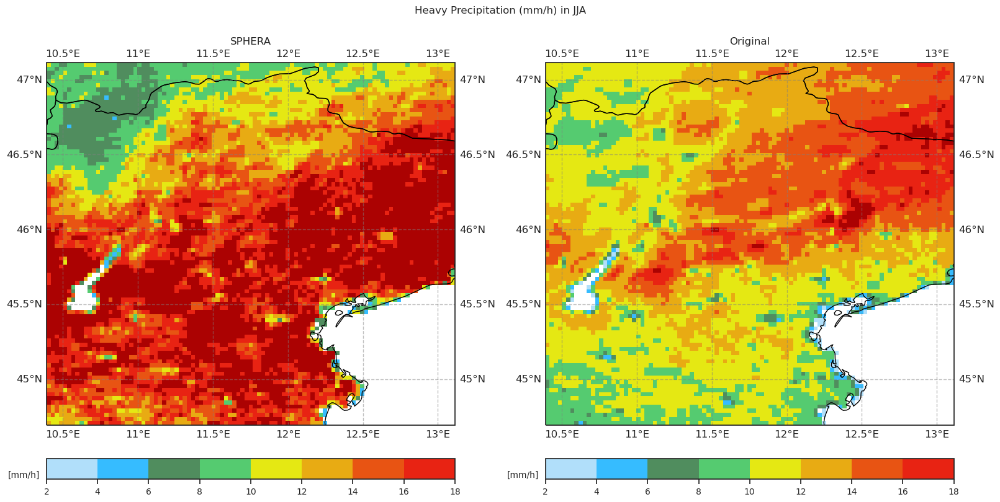

In [187]:
if VAR =="mw":

  plot_panel_rotated(
      figsize=(16,8),
      nrow=1,ncol=2,
      list_to_plot=[ds_ref.mw.isel(correction=0),
                    ds_ori.mw,
                      ],
      name_fig=f"map_PBias_ensemble_{metrics}_{ADJUST}_{seas}_{NQUANT}_mw",
      list_titles=["SPHERA","Original"],
      levels=[np.arange(1,15,2),np.arange(1,15,2)],
      suptitle=f"Heavy Winds (m/s) in {seas}",
      name_metric=["[m/s]","[m/s]","[m/s]"],
      SET_EXTENT=False,
      cmap=[cmap_q,cmap_q],
      SAVE=False
  )

elif VAR == "pr":
  plot_panel_rotated(
    figsize=(16,8),
    nrow=1,ncol=2,
    list_to_plot=[ds_ref.pr.isel(correction=0),
                  ds_ori.pr,
                    ],
    name_fig=f"map_PBias_ensemble_{metrics}_{ADJUST}_{seas}_{NQUANT}_pr",
    list_titles=["SPHERA","Original"],
    levels=[lvl_q,lvl_q],
    suptitle=f"Heavy Precipitation (mm/h) in {seas}",
    name_metric=["[mm/h]","[mm/h]","[mm/h]"],
    SET_EXTENT=False,
    cmap=[cmap_q,cmap_q],
    SAVE=False
)


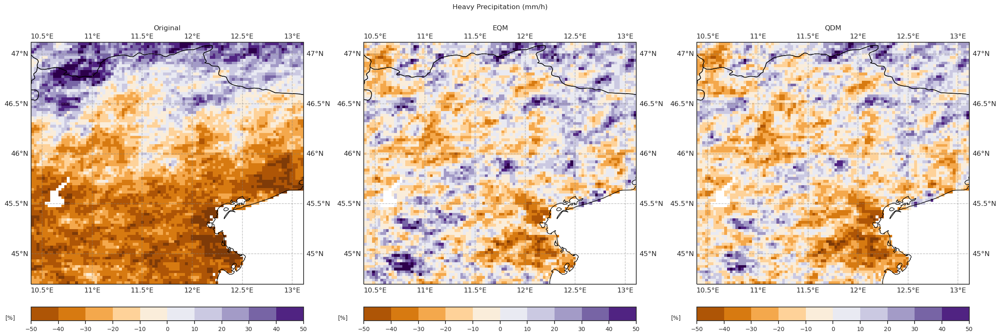

In [188]:
if VAR == 'mw':
    plot_panel_rotated(
        figsize=(24,8),
        nrow=1,ncol=3,
        list_to_plot=[((   bc_ori.mod - bc_ori.obs ) / bc_ori.obs * 100).isel(correction=0),
                        (( bc_eqm.mod - bc_ori.obs ) / bc_ori.obs * 100).isel(correction=0),
                        (( bc_qdm.mod - bc_ori.obs ) / bc_ori.obs * 100).isel(correction=0)
                        ],
        name_fig=f"map_PBias_ensemble_{metrics}_{ADJUST}_{seas}_{NQUANT}_mw",
        list_titles=["Original","EQM","QDM"],
        levels=[np.arange(-50,51,10),np.arange(-50,51,10),np.arange(-50,51,10)],
        suptitle=f"Heavy Winds (m/s)",
        # name_metric=["[mm/h]","[mm/h]","[mm/h]"],
        name_metric=["[%]","[%]","[%]"],
        SET_EXTENT=False,
        cmap=["PuOr","PuOr","PuOr"],
        SAVE=False
    )
elif VAR =='pr':
    plot_panel_rotated(
        figsize=(24,8),
        nrow=1,ncol=3,
        list_to_plot=[((   bc_ori.mod - bc_ori.obs ) / bc_ori.obs * 100).isel(correction=0),
                        (( bc_eqm.mod - bc_ori.obs ) / bc_ori.obs * 100).isel(correction=0),
                        (( bc_qdm.mod - bc_ori.obs ) / bc_ori.obs * 100).isel(correction=0)
                        ],
        name_fig=f"map_PBias_ensemble_{metrics}_{ADJUST}_{seas}_{NQUANT}_pr",
        list_titles=["Original","EQM","QDM"],
        levels=[np.arange(-50,51,10),np.arange(-50,51,10),np.arange(-50,51,10)],
        suptitle=f"Heavy Precipitation (mm/h)",
        # name_metric=["[mm/h]","[mm/h]","[mm/h]"],
        name_metric=["[%]","[%]","[%]"],
        SET_EXTENT=False,
        cmap=["PuOr","PuOr","PuOr"],
        SAVE=False
    )


In [189]:
def plot_boxplot_wind(list_to_concatenate,
                      names_to_concatenate,
                      title,filename,SAVE=False):
        df_box=pd.DataFrame(np.concatenate([mdl.reshape(-1,1) for mdl in list_to_concatenate],
                                axis=1),
                            columns=[name for name in names_to_concatenate])
        # df_box['col']='Heavy Prec, JJA'
        fig=plt.figure(figsize=(14,8))
        ax=plt.axes()
        # print(df_box.melt())
        sns.set(style="white")
        sns.boxplot(y="value", 
                    x="variable",
                    data=df_box.melt()[~pd.isnull(df_box.melt().value)], 
                    palette=["green","red",'blue'], 
                    notch=True,
                    width=0.25,
                    flierprops={"marker": "*"},
                    medianprops={"color": "coral"},
                    ax=ax)
        ax.hlines(y=-5, xmin=-1,xmax=3,linestyles='dashed',color='red')
        ax.hlines(y=25, xmin=-1,xmax=3,linestyles='dashed',color='red')
        ax.hlines(y=0, xmin=-1,xmax=3,linestyles='dashed',color='grey')
        ax.set_xlabel(f"")
        ax.set_ylabel(f"Relative Bias [%]")
        ax.set_ylim(-100,100)
        # ax.set_xticklabels([f"{m[:4]}. {s}" for s in seasons for m in list_ms],rotation=-25)
        plt.title(title,pad=20,fontsize=20)
        if SAVE:
            plt.savefig(f"figures/{filename}.png")
            plt.close()
        else:
            plt.show()

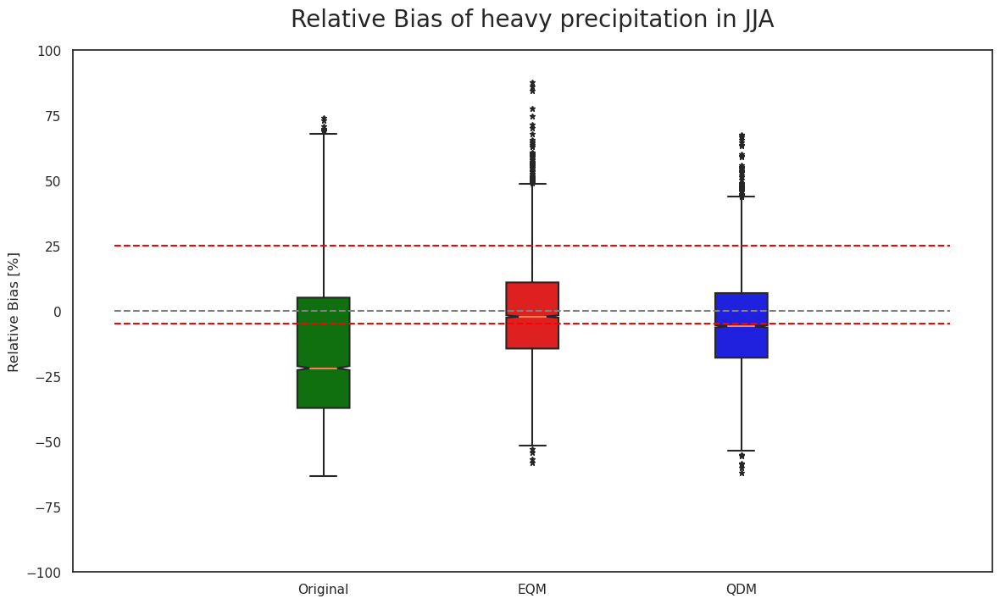

In [190]:

plot_boxplot_wind([bc_ori.PBias()[~np.isnan(bc_ori.PBias())],
                bc_eqm.PBias()[~np.isnan(bc_eqm.PBias())],
                bc_qdm.PBias()[~np.isnan(bc_qdm.PBias())]
            ],
            names_to_concatenate=["Original","EQM","QDM"],
            title=f"Relative Bias of heavy precipitation in {seas}",
            filename=f"PBias_ensemble_{metrics}_{ADJUST}_{seas}_{NQUANT}_mw",
            SAVE=False
            )


In [19]:
name_models=['ETH','MOHC','ICTP','HCLIMcom','CNRM','KNMI','CMCC','KIT','ENSEMBLE','SPHERA']

y=[xr.open_mfdataset(f"/home/lcesarini/2022_resilience/output/DJF/{nm}_q.nc").pr for nm in name_models]

In [48]:
def plot_panel_rotated(figsize,nrow,ncol,
                       list_to_plot,
                       name_fig,
                       list_titles='Any title',
                       levels=[9],
                       suptitle="Frequency for JJA",
                       name_metric=["Frequency"],
                       SET_EXTENT=True,
                       cmap=['rainbow'],
                       proj=ccrs.PlateCarree(),
                       transform=ccrs.PlateCarree(),
                       SAVE=True
                    ):
    """
    
    Plots panel of the given xarray datasets
    
    Parameters
    ----------
    list_to_plot : list, defaults to None
                  list of the dataarray to plot 
    name_fig: 

    list_titles: 

    levels: either an int indicating the number of intervals or a list of values to break to palette into.
    Returns
    -------



    Examples
        --------
    
    """
    fig,axs=plt.subplots(nrow,ncol,
                        figsize=figsize,constrained_layout=True, squeeze=True,
                        subplot_kw={"projection":proj})

    if (nrow > 1) or (ncol > 1):
        ax=axs.flatten()
    else:
        ax=axs

    # Remove spaces between subplots
    plt.subplots_adjust(wspace=0, hspace=0)

    for i,model in enumerate(list_to_plot):
        # if i in [0,1,2]:
        #     pcm=model.plot.\
        #         pcolormesh(x="lon",y="lat",ax=ax[i],
        #                    add_colorbar=False,
        #                 #    cbar_kwargs={"shrink":0.85},
        #                    levels=np.arange(0.04,0.28,0.03),
        #                    cmap="rainbow",
        #                    #norm=norm
        #                    )
        # else:
        if (nrow > 1) or (ncol > 1) :
            pcm=model.plot.pcolormesh(ax=ax[i],
                                    add_colorbar=False,
                                    #   cbar_kwargs={"shrink":0.85},
                                    levels=levels[i],
                                    cmap=cmap[i],#"rainbow",
                                    transform=transform                                    
                                    )

            shp_triveneto.boundary.plot(ax=ax[i],edgecolor='red',transform=proj,linewidth=1)
            ax[i].add_feature(cfeature.BORDERS)
            ax[i].coastlines()
            if SET_EXTENT:
                ax[i].set_extent([10.2,13.15,44.6,47.15])
            ax[i].set_title(f"{list_titles[i]}")
            gl = ax[i].gridlines(
                draw_labels=True, linewidth=1, color='gray', alpha=0.5, linestyle='--',
            )
            gl.xlabels=False
            if i in np.arange(ncol*nrow-ncol,ncol*nrow):
                cbar=fig.colorbar(pcm, ax=ax[i] if (nrow > 1) or (ncol > 1) else ax, 
                                    extend='both', 
                                    orientation='horizontal',
                                    shrink=1.25)
                cbar.ax.tick_params(labelsize=10)
                cbar.ax.set_ylabel(name_metric[i],fontsize=10,rotation=0,loc='bottom',labelpad=55)
                ax[i].add_feature(cfeature.BORDERS)
                # ax[i].add_feature(cfeature.STATES)

        else:
            pcm=model.plot.pcolormesh(ax=ax,
                        add_colorbar=False,
                        #   cbar_kwargs={"shrink":0.85},
                        levels=levels[i],
                        cmap=cmap[i],#"rainbow",
                        transform=transform                                    
                        )

            shp_triveneto.boundary.plot(ax=ax,edgecolor='red')
            # ax.add_geometries(shp_triveneto['geometry'], crs=proj)
            ax.add_feature(cfeature.BORDERS)
            ax.coastlines()
            ax.set_title(f"{list_titles[i]}")
            gl = ax.gridlines(
                draw_labels=True, linewidth=1, color='gray', alpha=0.5, linestyle='--'
            )
            if SET_EXTENT:
                ax.set_extent([10.2,13.15,44.6,47.15])

            gl.xlines=None
            gl.xlabels_top=None
            gl.xlabels_bottom=None

            # cbar=fig.colorbar(pcm, ax=ax, extend='both', orientation='horizontal')
            if i in [0,1,2]:
                cbar=fig.colorbar(pcm, ax=ax[i] if (nrow > 1) or (ncol > 1) else ax, 
                                    extend='both', 
                                    orientation='vertical',
                                    shrink=0.85)
                cbar.ax.tick_params(labelsize=30)
                cbar.ax.set_ylabel(name_metric[i],fontsize=10,rotation=0,loc='bottom')
    fig.suptitle(suptitle, fontsize=12)
    if SAVE:
        plt.savefig(f"/home/lcesarini/2022_resilience/figures/{name_fig}.png")
        plt.close()
    else:
        plt.show()


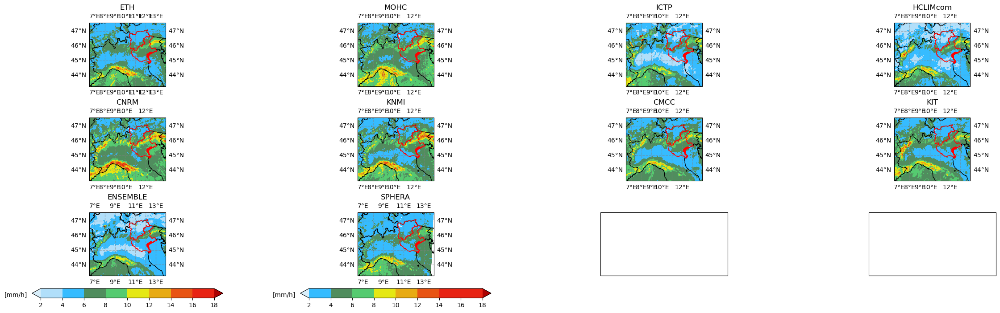

In [44]:
plot_panel_rotated(
    figsize=(24,7),
    nrow=3,ncol=4,
    list_to_plot=y,
    name_fig=f"panel_q_all",
    list_titles= [nm for nm in name_models],
    levels=[lvl_q for _ in range(len(y))],
    suptitle=f"",
    # name_metric=["[mm/h]","[mm/h]","[mm/h]"],
    name_metric=["[mm/h]" for _ in range(len(y))],
    SET_EXTENT=False,
    cmap=[cmap_q for _ in range(len(y))],
    SAVE=False
)

In [40]:
nm_winds=['ETH', 'ICTP', 'HCLIMcom', 'CNRM', 'KNMI', 'CMCC', 'KIT', 'ENSEMBLE', 'SPHERA']

winds=[xr.open_mfdataset(f"/home/lcesarini/2022_resilience/output/DJF/mw/{nm}_6_q.nc").mw.isel(quantile=0) for nm in nm_winds]


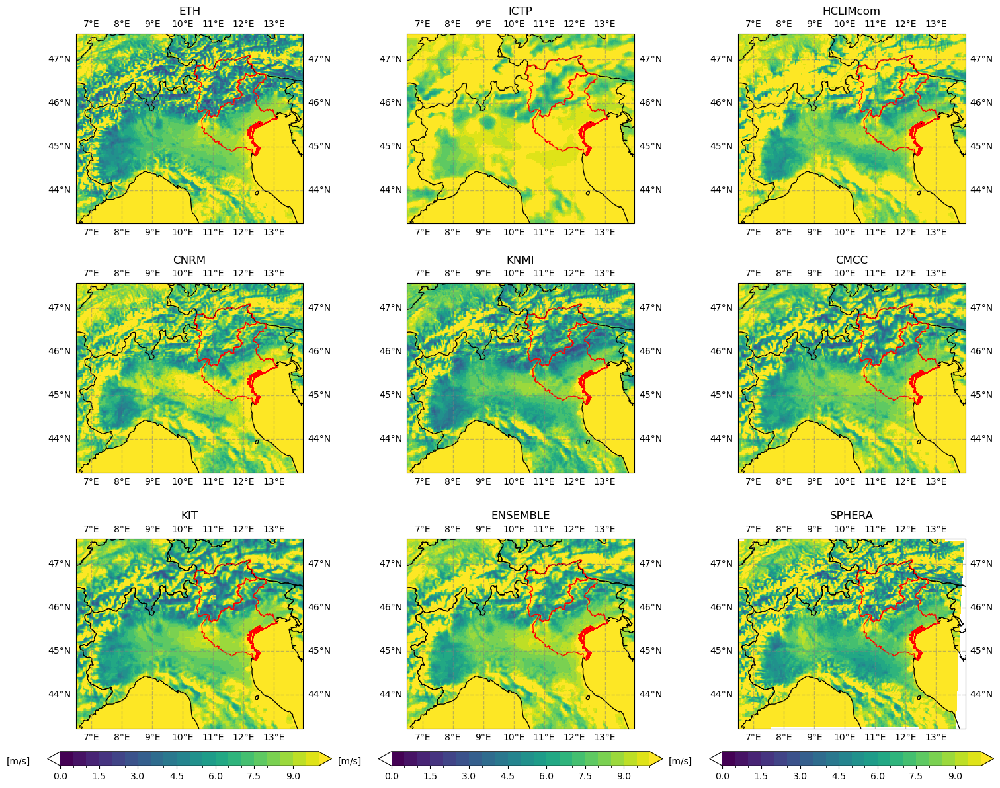

In [49]:
plot_panel_rotated(
    figsize=(15,12),
    nrow=3,ncol=3,
    list_to_plot=winds,
    name_fig=f"panel_q_all",
    list_titles= [nm for nm in nm_winds],
    levels=[np.arange(0.,10.5,0.5) for _ in range(len(winds))],
    suptitle=f"",
    # name_metric=["[mm/h]","[mm/h]","[mm/h]"],
    name_metric=["[m/s]" for _ in range(len(winds))],
    SET_EXTENT=False,
    cmap=["viridis" for _ in range(len(winds))],
    SAVE=False
)

In [82]:
name_models=['ETH','MOHC','ICTP','HCLIMcom','CNRM','KNMI','CMCC','KIT','ENSEMBLE']
seasons=['SON','DJF','MAM','JJA']
list_ms=['Frequency','Intensity','Heavy Prec.']
abbr_ms=['f','i','q']

array_heatmap=np.zeros(shape=(4,3))
array_boxplot=np.zeros(shape=(42976,12)) * np.nan
sea_mask=xr.open_dataset("/mnt/data/RESTRICTED/CARIPARO/DATA_FPS/ECMWF-ERAINT/CNRM/sftlf_ALP-3_CNRM-CERFACS-CNRM-CM5_historical_r1i1p1_CNRM-AROME41t1_fx_remap.nc")

counter=0

PATH_OUTPUT="/home/lcesarini/2022_resilience/output"

for i,SEAS in enumerate(seasons):
    for j,(idx,metrics) in enumerate(zip(abbr_ms,list_ms)):
        
        ds_cpm=xr.concat([xr.load_dataset(f"{PATH_OUTPUT}/{SEAS}/{nm}_{idx}.nc") for nm in name_models],name_models).rename({'concat_dim':'name'})
        ds_cpm=ds_cpm * sea_mask.sftlf
        # ds_cpm=xr.open_dataset(f"output/{SEAS}/ENSEMBLE_{idx}.nc") * sea_mask.sftlf
        ds_rea=xr.open_dataset(f"output/{SEAS}/SPHERA_{idx}.nc") * sea_mask.sftlf.values
        
        rel_bias= ( ds_cpm - ds_rea ) / ds_rea
        rel_bias=rel_bias.sel(name="ENSEMBLE")

        array_heatmap[i,j]=np.nanmedian(rel_bias.pr.values[np.isfinite(rel_bias.pr)]) * 100
        finite_res=rel_bias.pr.values[np.isfinite(rel_bias.pr)].shape[0]
        array_boxplot[:finite_res,counter]  = (rel_bias.pr.values[np.isfinite(rel_bias.pr)] * 100).reshape(-1)
        # array_boxplot[:,counter+1] = f"{metrics} {SEAS}"
        #print(f"{metrics} bias in {SEAS}: {np.nanmean(rel_bias.pr) * 100:.2f}%")
        counter+=1


Text(0.5, 1.0, 'Bias CPM vs SPHERA for heavy precipitation in JJA')

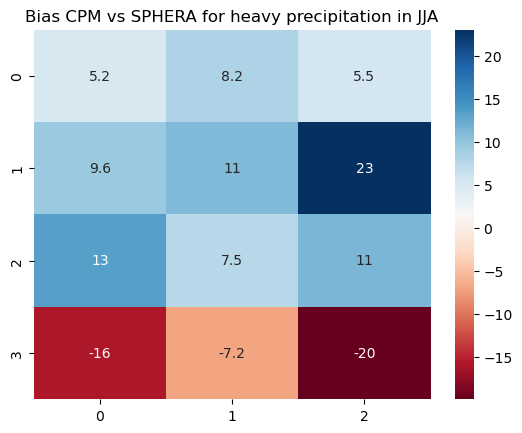

In [87]:
sns.heatmap(array_heatmap,annot=True,cmap="RdBu")
plt.title(f"Bias CPM vs SPHERA for heavy precipitation in {SEAS}")

Text(0.5, 1.0, 'Relative bias of CPM vs SPHERA')

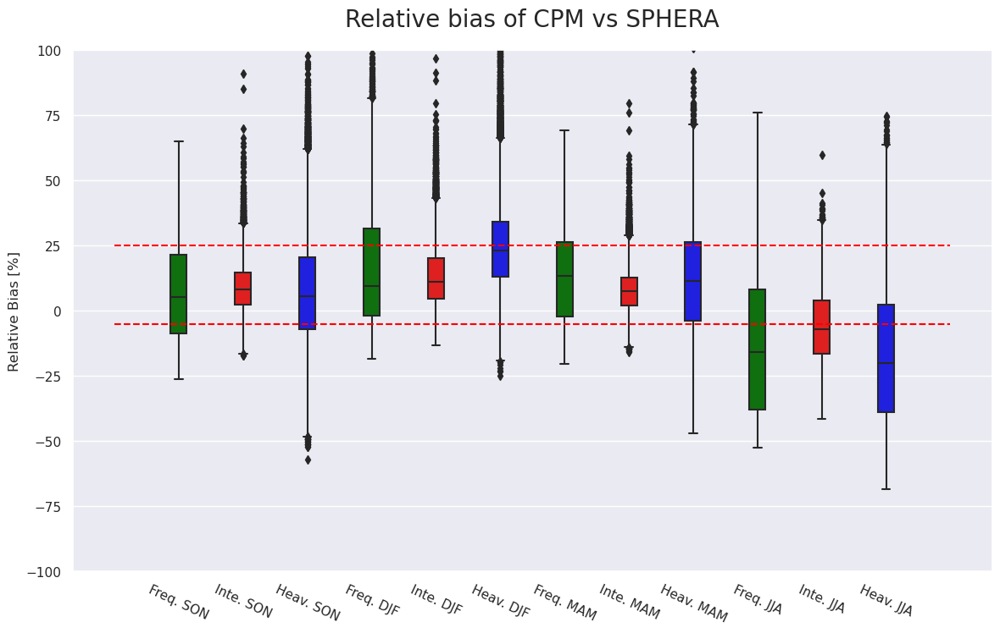

In [89]:
df_box=pd.DataFrame(array_boxplot,columns=[f'{m} {s}' for s in seasons for m in list_ms])
# df_box['col']='Heavy Prec, JJA'
fig=plt.figure(figsize=(14,8))
ax=plt.axes()
# print(df_box.melt())
sns.set(style="darkgrid")
sns.boxplot(y="value", 
            x="variable",
            data=df_box.melt(), 
            palette=["green","red","blue"], 
            width=0.25,
            ax=ax)
ax.hlines(y=-5, xmin=-1,xmax=12,linestyles='dashed',color='red')
ax.hlines(y=25, xmin=-1,xmax=12,linestyles='dashed',color='red')
ax.set_xlabel(f"")
ax.set_ylabel(f"Relative Bias [%]")
ax.set_ylim(-100,100)
ax.set_xticklabels([f"{m[:4]}. {s}" for s in seasons for m in list_ms],rotation=-25)
plt.title(f"Relative bias of CPM vs SPHERA",pad=20,fontsize=20)



In [93]:

seasons=['SON','DJF','MAM','JJA']
list_ms=['Frequency','Intensity','Heavy Prec.']
abbr_ms=['m','f','q']

array_heatmap=np.zeros(shape=(4,3))
array_boxplot=np.zeros(shape=(42976,12)) * np.nan
sea_mask=xr.open_dataset("/mnt/data/RESTRICTED/CARIPARO/DATA_FPS/ECMWF-ERAINT/CNRM/sftlf_ALP-3_CNRM-CERFACS-CNRM-CM5_historical_r1i1p1_CNRM-AROME41t1_fx_remap.nc")

counter=0

PATH_OUTPUT="/home/lcesarini/2022_resilience/output"

for i,SEAS in enumerate(seasons):
    for j,(idx,metrics) in enumerate(zip(abbr_ms,list_ms)):
        
        ds_cpm=xr.concat([xr.load_dataset(f"{PATH_OUTPUT}/{SEAS}/mw/{nm}_6_{idx}.nc") for nm in ["ENSEMBLE"]],["ENSEMBLE"]).rename({'concat_dim':'name'})
        ds_cpm=ds_cpm * sea_mask.sftlf
        # ds_cpm=xr.open_dataset(f"output/{SEAS}/ENSEMBLE_{idx}.nc") * sea_mask.sftlf
        ds_rea=xr.open_dataset(f"output/{SEAS}/mw/SPHERA_6_{idx}.nc") * sea_mask.sftlf.values
        
        rel_bias= ( ds_cpm - ds_rea ) / ds_rea
        rel_bias=rel_bias.sel(name="ENSEMBLE")

        array_heatmap[i,j]=np.nanmedian(rel_bias.mw.values[np.isfinite(rel_bias.mw)]) * 100
        finite_res=rel_bias.mw.values[np.isfinite(rel_bias.mw)].shape[0]
        array_boxplot[:finite_res,counter]  = (rel_bias.mw.values[np.isfinite(rel_bias.mw)] * 100).reshape(-1)
        # array_boxplot[:,counter+1] = f"{metrics} {SEAS}"
        #print(f"{metrics} bias in {SEAS}: {np.nanmean(rel_bias.pr) * 100:.2f}%")
        counter+=1


Text(0.5, 1.0, 'Bias CPM vs SPHERA for heavy winds in JJA')

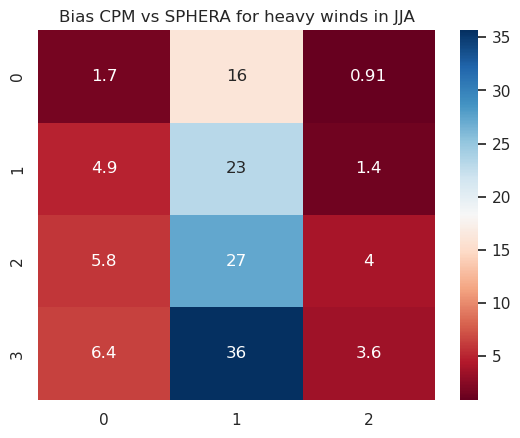

In [94]:
sns.heatmap(array_heatmap,annot=True,cmap="RdBu")
plt.title(f"Bias CPM vs SPHERA for heavy winds in {SEAS}")

In [103]:
[f"{m[:4]}. {s}" for s in seasons for m in ["Mean Speed","Freq above 6 m/s","Heavy Winds"]]

['Mean. SON',
 'Freq. SON',
 'Heav. SON',
 'Mean. DJF',
 'Freq. DJF',
 'Heav. DJF',
 'Mean. MAM',
 'Freq. MAM',
 'Heav. MAM',
 'Mean. JJA',
 'Freq. JJA',
 'Heav. JJA']

Text(0.5, 1.0, 'Relative bias of CPM vs SPHERA Winds')

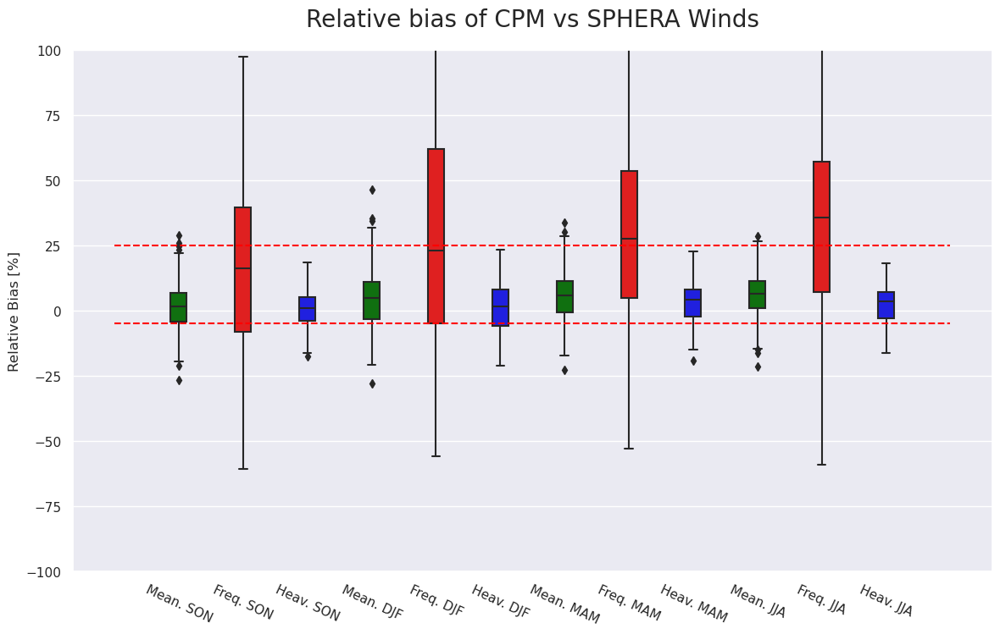

In [102]:
df_box=pd.DataFrame(array_boxplot,columns=[f'{m} {s}' for s in seasons for m in ["Mean Speed","Freq above 6 m/s","Heavy Winds"]])
# df_box['col']='Heavy Prec, JJA'
fig=plt.figure(figsize=(14,8))
ax=plt.axes()
# print(df_box.melt())
sns.set(style="darkgrid")
sns.boxplot(y="value", 
            x="variable",
            data=df_box.melt(), 
            palette=["green","red","blue"], 
            width=0.25,
            ax=ax)
ax.hlines(y=-5, xmin=-1,xmax=12,linestyles='dashed',color='red')
ax.hlines(y=25, xmin=-1,xmax=12,linestyles='dashed',color='red')
ax.set_xlabel(f"")
ax.set_ylabel(f"Relative Bias [%]")
ax.set_ylim(-100,100)
ax.set_xticklabels([f"{m[:4]}. {s}" for s in seasons for m in ["Mean Speed","Freq above 6 m/s","Heavy Winds"]],rotation=-25)
plt.title(f"Relative bias of CPM vs SPHERA Winds",pad=20,fontsize=20)



In [2]:
from xclim import sdba

In [3]:
PATH_COMMON_DATA="/mnt/data/RESTRICTED/CARIPARO/DATA_FPS/ECMWF-ERAINT"

mohc_rg=xr.open_mfdataset(f"{PATH_COMMON_DATA}/MOHC/CPM/pr/MOHC_ECMWF-ERAINT_*.nc").load()


HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 1:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object not 

In [4]:
mohc_rg=mohc_rg.sel(time=mohc_rg.time.dt.year.isin(np.arange(2000,2010)))
mohc_rg

<xarray.Dataset>
Dimensions:    (time: 87672, bnds: 2, lon: 272, lat: 158)
Coordinates:
  * time       (time) datetime64[ns] 2000-01-01T00:30:00 ... 2009-12-31T23:30:00
  * lon        (lon) float64 6.5 6.527 6.555 6.582 ... 13.87 13.9 13.92 13.95
  * lat        (lat) float64 43.25 43.28 43.3 43.33 ... 47.48 47.51 47.54 47.57
Dimensions without coordinates: bnds
Data variables:
    time_bnds  (time, bnds) datetime64[ns] 2000-01-01 ... 2010-01-01
    pr         (time, lat, lon) float32 0.0 0.0 0.0 ... 4.681e-05 2.94e-05
Attributes: (12/24)
    CDI:                            Climate Data Interface version 1.9.8 (htt...
    history:                        Fri Feb 03 16:07:53 2023: cdo remapycon,n...
    institution:                    MetOffice, Hadley Centre, UK
    Conventions:                    CF-1.5
    CORDEX_domain:                  REU-2
    contact:                        segolene.berthou@metoffice.gov.uk
    ...                             ...
    product:                        output
    project_id:                     CORDEX-FPSCONV
    rcm_version_id:                 fpsconv-x0n1-v1
    references:                     Berthou et al. (2018). Pan-European clima...
    tracking_id:                    hdl:21.14100/f9702e00-5cc4-41d2-a595-60c1...
    CDO:                            Climate Data Operators version 1.9.8 (htt...

In [5]:
sphera=xr.open_mfdataset(f"/mnt/data/RESTRICTED/CARIPARO/DATA_FPS/reanalysis/SPHERA/pr/*200*.nc").load()


HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 21:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object not

In [6]:
sphera=sphera.sel(time=sphera.time.dt.year.isin(np.arange(2000,2010)))
sphera

<xarray.Dataset>
Dimensions:    (time: 87542, latitude: 158, longitude: 272)
Coordinates:
  * time       (time) datetime64[ns] 2000-01-01T01:00:00 ... 2009-12-31T23:00:00
    surface    float64 0.0
  * latitude   (latitude) float64 43.25 43.28 43.3 43.33 ... 47.51 47.54 47.57
  * longitude  (longitude) float64 6.5 6.527 6.555 6.582 ... 13.9 13.92 13.95
Data variables:
    pr         (time, latitude, longitude) float64 0.0 0.0 0.0 ... nan nan nan
Attributes:
    GRIB_edition:            2
    GRIB_centre:             edzw
    GRIB_centreDescription:  Offenbach 
    GRIB_subCentre:          255
    Conventions:             CF-1.7
    institution:             Offenbach 
    history:                 2023-03-08T12:57 GRIB to CDM+CF via cfgrib-0.9.1...

In [7]:
sphera.pr.isel(longitude=12,latitude=12), mohc_rg.pr.isel(lon=12,lat=12)

(<xarray.DataArray 'pr' (time: 87542)>
 array([0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        4.50585938e+00, 2.22656250e+00, 3.90625000e-03])
 Coordinates:
   * time       (time) datetime64[ns] 2000-01-01T01:00:00 ... 2009-12-31T23:00:00
     surface    float64 0.0
     latitude   float64 43.58
     longitude  float64 6.83,
 <xarray.DataArray 'pr' (time: 87672)>
 array([0.000000e+00, 0.000000e+00, 0.000000e+00, ..., 0.000000e+00,
        0.000000e+00, 5.455367e-09], dtype=float32)
 Coordinates:
   * time     (time) datetime64[ns] 2000-01-01T00:30:00 ... 2009-12-31T23:30:00
     lon      float64 6.83
     lat      float64 43.58
 Attributes:
     standard_name:  precipitation
     units:          mm hr-1)

In [17]:
mohc_rg=mohc_rg.assign_attrs(units="mm/hr")


In [29]:
sphera=sphera.assign_attrs(units="mm/hr")
sphera

<xarray.Dataset>
Dimensions:    (time: 87542, latitude: 158, longitude: 272)
Coordinates:
  * time       (time) datetime64[ns] 2000-01-01T01:00:00 ... 2009-12-31T23:00:00
    surface    float64 0.0
  * latitude   (latitude) float64 43.25 43.28 43.3 43.33 ... 47.51 47.54 47.57
  * longitude  (longitude) float64 6.5 6.527 6.555 6.582 ... 13.9 13.92 13.95
Data variables:
    pr         (time, latitude, longitude) float64 0.0 0.0 0.0 ... nan nan nan
Attributes:
    GRIB_edition:            2
    GRIB_centre:             edzw
    GRIB_centreDescription:  Offenbach 
    GRIB_subCentre:          255
    Conventions:             CF-1.7
    institution:             Offenbach 
    history:                 2023-03-08T12:57 GRIB to CDM+CF via cfgrib-0.9.1...
    unit:                    mm/hr
    units:                   mm/hr

In [42]:
QM = sdba.EmpiricalQuantileMapping.train(
    sphera.pr.assign_attrs(units="mm/h").isel(longitude=12,latitude=12),
    mohc_rg.pr.isel(lon=12,lat=12), 
    nquantiles=15, group="time", kind="+"
)

In [43]:
mohc_adj = QM.adjust(mohc_rg.pr.isel(lon=12,lat=12), extrapolation="constant", interp="nearest")
mohc_adj

<xarray.DataArray 'scen' (time: 87672)>
array([0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
       0.00000000e+00, 0.00000000e+00, 5.45536682e-09])
Coordinates:
  * time       (time) datetime64[ns] 2000-01-01T00:30:00 ... 2009-12-31T23:30:00
    longitude  float64 6.83
    lon        float64 6.83
    lat        float64 43.58
    surface    float64 0.0
    latitude   float64 43.58
Attributes:
    standard_name:    precipitation
    units:            mm/h
    history:          [2023-04-03 18:40:47] : Bias-adjusted with EmpiricalQua...
    bias_adjustment:  EmpiricalQuantileMapping(group=Grouper(name='time'), ki...

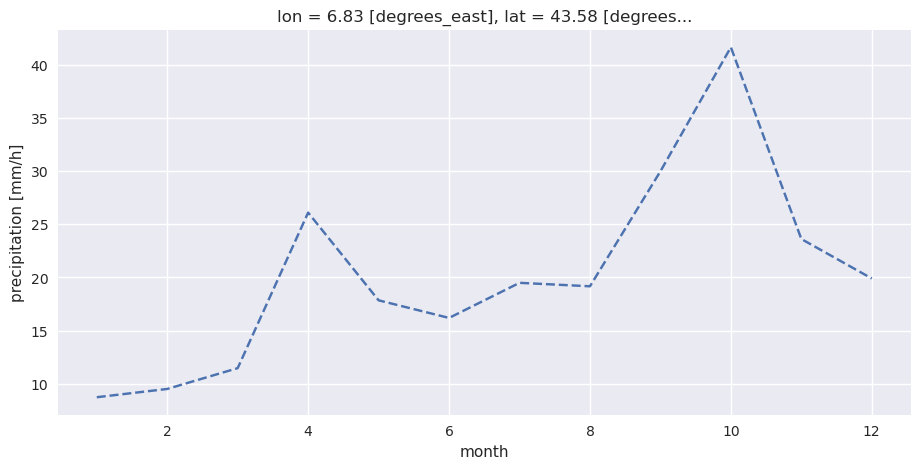

In [53]:
mohc_adj.groupby("time.month").max().plot(
    label="Model - adjusted - 2000-15", linestyle="--"
)

AttributeError: 'list' object has no attribute 'groupby'

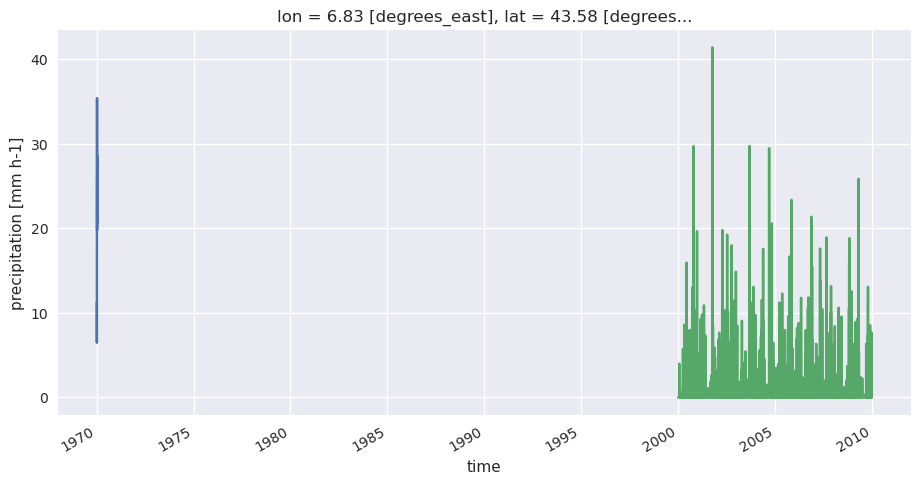

In [51]:
sphera.pr.assign_attrs(units="mm/h").isel(longitude=12,latitude=12).groupby("time.month").max().plot(label="Reference")
mohc_rg.pr.isel(lon=12,lat=12).plot(label="Model - biased").groupby("time.month").max()
mohc_adj.groupby("time.month").max().plot(
    label="Model - adjusted - 2000-15", linestyle="--"
)
plt.legend()


/tmp/ipykernel_4073674/2732346357.py:8: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn")


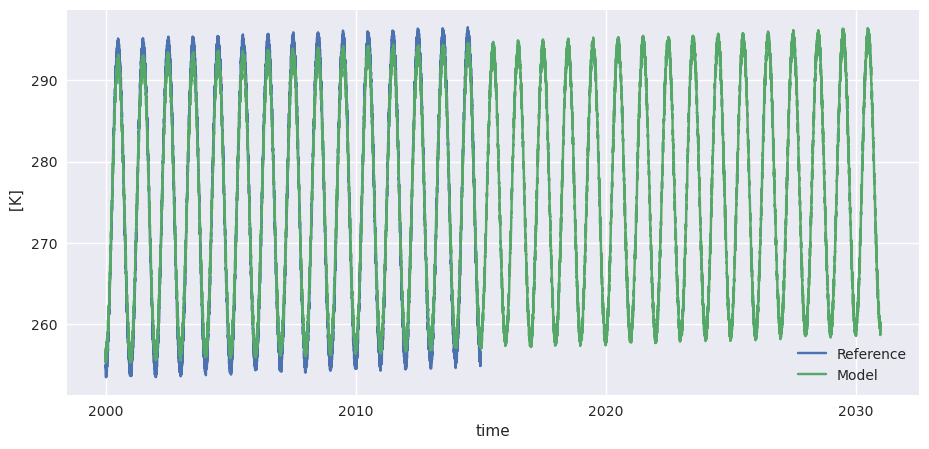

In [35]:
import cftime
import matplotlib.pyplot as plt
import nc_time_axis
import numpy as np
import xarray as xr

%matplotlib inline
plt.style.use("seaborn")
plt.rcParams["figure.figsize"] = (11, 5)

# Create toy data to explore bias adjustment, here fake temperature timeseries
t = xr.cftime_range("2000-01-01", "2030-12-31", freq="D", calendar="noleap")
ref = xr.DataArray(
    (
        -20 * np.cos(2 * np.pi * t.dayofyear / 365)
        + 2 * np.random.random_sample((t.size,))
        + 273.15
        + 0.1 * (t - t[0]).days / 365
    ),  # "warming" of 1K per decade,
    dims=("time",),
    coords={"time": t},
    attrs={"units": "K"},
)
sim = xr.DataArray(
    (
        -18 * np.cos(2 * np.pi * t.dayofyear / 365)
        + 2 * np.random.random_sample((t.size,))
        + 273.15
        + 0.11 * (t - t[0]).days / 365
    ),  # "warming" of 1.1K per decade
    dims=("time",),
    coords={"time": t},
    attrs={"units": "K"},
)

ref = ref.sel(time=slice(None, "2015-01-01"))
hist = sim.sel(time=slice(None, "2015-01-01"))

ref.plot(label="Reference")
sim.plot(label="Model")
plt.legend()

In [36]:
QM = sdba.EmpiricalQuantileMapping.train(
    ref, hist, nquantiles=15, group="time", kind="+"
)

In [40]:
scen = QM.adjust(sim, extrapolation="constant", interp="nearest")
sim.shape


(11315,)